#### CUS 735 Web Data Mining
#### Spring 2021
#### Peter Tadrous

# Part 2 Topic Modeling
Perform a topic analysis by applying any of the models learned in class.

In [1]:
import os
import pandas as pd # used to manipulate and analyze the data
from sklearn.preprocessing import MultiLabelBinarizer # needed for one-hot encoding of tokens
from ast import literal_eval # for converting string representation of a list to a list
import nltk
import math # for tf idf
from tqdm import tqdm # for tf idf
import numpy as np

In **Part 1**, I focused on the data acquisition, cleaning, and Named Entity Recognition (NERs). Let's read in the final tokenized dataset from before.

In [5]:
questions_df = pd.read_csv('./data/final_tokenized_questions.csv')

Before proceeding with the data, I have to convert the string representations of lists in the `synonym`, `tokens`, `bigrams`, and `trigrams` columns into lists, since reading in the data caused each cell of the dataframe to be read in as a list. That enables me to use create a `tf idf` document matrix. I also want to clean the three new columns the same way I cleaned the original dataset by removing stopwords and punctuation.

In [6]:
# Remove stopwords and punctuation
from nltk.corpus import stopwords

def remove_punctuation(corpus):
    punctuation = ".,\"-\\/#!?$%\^&\*;:{}=\-_'~()"
    filtered_corpus = [token for token in corpus if (not token in punctuation)]
    return filtered_corpus

def remove_stopwords(corpus):
    filtered_corpus = [token for token in corpus if (not token in stopwords.words('english'))]
    return filtered_corpus

def remove_small_words(corpus, min_len):
    filtered_corpus = [token for token in corpus if (len(token) > min_len) or any(i.isdigit() for i in token)]
    return filtered_corpus

def filter_tokens(corpus, min_word_len=3):
    return remove_punctuation(remove_stopwords(remove_small_words(corpus, min_word_len)))

def tokenize_helper(string):
    string = str.lower(string)
    tokens = nltk.word_tokenize(string)
    filtered_tokens = filter_tokens(tokens)
    return '_'.join(filtered_tokens)

def convert_to_list(string_val, tokenize = False):
    if "[" in string_val:
        list_val = literal_eval(string_val)
        if tokenize:
            return [tokenize_helper(string) for string in list_val]
        return list_val
    if tokenize:
        return [tokenize_helper(string_val)]
    return string_val

In [7]:
questions_df['question_type'] = questions_df['question_type'].apply(convert_to_list, args=(True,))
questions_df['focus'] = questions_df['focus'].apply(convert_to_list, args=(True,))
questions_df['synonym'] = questions_df['synonym'].apply(convert_to_list, args=(True,))
questions_df['tokens'] = questions_df['tokens'].apply(convert_to_list)
questions_df['bigrams'] = questions_df['bigrams'].apply(convert_to_list)
questions_df['trigrams'] = questions_df['trigrams'].apply(convert_to_list)

In [8]:
questions_df.head(5)

,question,question_type,focus,synonym,tokens,bigrams,trigrams
0,Do you have information about Refractive eye s...,[information],[refractive_surgery_doctor],"[doctor_refractive_surgery, nearsightedness_su...","[information, refractive, surgery, doctor]",[],[]
1,Do you have information about Ammonium hydroxi...,[information],[ammonium_hydroxide_poisoning],[aqueous_ammonia],"[information, ammonium, hydroxide, poisoning]",[],[]
2,Do you have information about Lymphangiogram,[information],[lymphangiogram],"[lymphography, lymphangiography]","[information, lymphangiogram]",[],[]
3,Do you have information about Folic acid in diet,[information],[folic_acid_diet],"[folic_acid, polyglutamyl_folacin, pteroylmono...","[information, folic, acid, diet]",[folic_acid],[]
4,What is (are) Incontinentia pigmenti ?,[information],[incontinentia_pigmenti],[bloch-sulzberger_syndrome],"[incontinentia, pigmenti]",[incontinentia_pigmenti],[]


Now I can concatenate the lists in the `tokens`, `bigrams`, and `trigrams` columns to create a document matrix. I can also include the `focus`, and `synonym` columns to the `tokens` column, and leave the `question_type` column as the class feature if we need it. I also want to add the `tokens`, `focus`, `synonym`, `bigram`, and `trigram` values to the original `question` string so that they are picked up by the `tf idf` even with the `_` in the string, so I will create a new column called `multi_word_tokens`.

In [9]:
vocabulary_df = questions_df[['question']].copy()
vocabulary_df['tokens'] = (
    + questions_df['focus']
    + questions_df['synonym']
    + questions_df['tokens']
    + questions_df['bigrams']
    + questions_df['trigrams']
)

vocabulary_df['multi_word_tokens'] = (
    + questions_df['focus']
    + questions_df['synonym']
    + questions_df['bigrams']
    + questions_df['trigrams']
)
vocabulary_df['tokens'] = vocabulary_df['tokens'].apply(lambda x: set(x))
vocabulary_df['tokens'] = vocabulary_df['tokens'].apply(lambda x: list(x))
vocabulary_df['multi_word_tokens'] = vocabulary_df['multi_word_tokens'].apply(lambda x: set(x))
vocabulary_df['multi_word_tokens'] = vocabulary_df['multi_word_tokens'].apply(lambda x: list(x))

vocabulary_df['tokens'] = vocabulary_df['tokens'].apply(lambda x: [y for y in x if y])
vocabulary_df['multi_word_tokens'] = vocabulary_df['multi_word_tokens'].apply(lambda x: [y for y in x if y])
vocabulary_df['question_type'] = questions_df['question_type'].apply(lambda x: ''.join(x))

for idx, row in vocabulary_df.iterrows():
    modified_document = [token for token in row['multi_word_tokens'] if ('_' in token
                                                                         or token not in row['question'])]
    modified_document = [row['question']] + modified_document
    vocabulary_df.loc[idx, 'modified_question'] = ' '.join(modified_document)

I set the modified document as the index now and have all the single- and multi- word `tokens`, `focus`, `synonym`, and `question_type`s as a single list in the one column, so I am ready to create the document matrix.

In [10]:
vocabulary_df

,question,tokens,multi_word_tokens,question_type,modified_question
0,Do you have information about Refractive eye s...,"[nearsightedness_surgery_doctor, doctor_refrac...","[nearsightedness_surgery_doctor, doctor_refrac...",information,Do you have information about Refractive eye s...
1,Do you have information about Ammonium hydroxi...,"[aqueous_ammonia, poisoning, hydroxide, ammoni...","[aqueous_ammonia, ammonium_hydroxide_poisoning]",information,Do you have information about Ammonium hydroxi...
2,Do you have information about Lymphangiogram,"[lymphangiography, information, lymphangiogram...","[lymphangiography, lymphangiogram, lymphography]",information,Do you have information about Lymphangiogram l...
3,Do you have information about Folic acid in diet,"[polyglutamyl_folacin, folic, folate, folic_ac...","[polyglutamyl_folacin, folate, folic_acid, fol...",information,Do you have information about Folic acid in di...
4,What is (are) Incontinentia pigmenti ?,"[pigmenti, bloch-sulzberger_syndrome, incontin...","[bloch-sulzberger_syndrome, incontinentia_pigm...",information,What is (are) Incontinentia pigmenti ? bloch-s...
...,...,...,...,...,...
23314,What are the treatments for Duane syndrome typ...,"[duane_syndrome_type_1, 1, duane_syndrome_type...","[duane_syndrome_type_1, duane_syndrome_type, s...",treatment,What are the treatments for Duane syndrome typ...
23315,What are the symptoms of Striatonigral degener...,"[degeneration, infantile, ibsn, striatal_degen...","[ibsn, striatal_degeneration_familial, infanti...",symptoms,What are the symptoms of Striatonigral degener...
23316,What are the symptoms of Maturity-onset diabet...,"[diabetes_young, type_7, maturity-onset, type_...","[diabetes_mellitus_mody_type_7, mody_klf11_rel...",symptoms,What are the symptoms of Maturity-onset diabet...
23317,What are the symptoms of Holzgreve syndrome ?,"[holzgreve, holzgreve_syndrome, complex_congen...","[holzgreve_syndrome, complex_congenital_heart_...",symptoms,What are the symptoms of Holzgreve syndrome ? ...


In [11]:
vocabulary_df.set_index('modified_question',inplace=True,drop=False)
vocabulary_df.head(5)

,question,tokens,multi_word_tokens,question_type,modified_question
modified_question,,,,,
Do you have information about Refractive eye surgery - what to ask your doctor nearsightedness_surgery_doctor doctor_refractive_surgery laser_vision_correction_doctor refractive_surgery_doctor laser-assisted_situ_keratomileusis_doctor lasik_doctor,Do you have information about Refractive eye s...,"[nearsightedness_surgery_doctor, doctor_refrac...","[nearsightedness_surgery_doctor, doctor_refrac...",information,Do you have information about Refractive eye s...
Do you have information about Ammonium hydroxide poisoning aqueous_ammonia ammonium_hydroxide_poisoning,Do you have information about Ammonium hydroxi...,"[aqueous_ammonia, poisoning, hydroxide, ammoni...","[aqueous_ammonia, ammonium_hydroxide_poisoning]",information,Do you have information about Ammonium hydroxi...
Do you have information about Lymphangiogram lymphangiography lymphangiogram lymphography,Do you have information about Lymphangiogram,"[lymphangiography, information, lymphangiogram...","[lymphangiography, lymphangiogram, lymphography]",information,Do you have information about Lymphangiogram l...
Do you have information about Folic acid in diet polyglutamyl_folacin folate folic_acid folic_acid_diet pteroylmonoglutamate,Do you have information about Folic acid in diet,"[polyglutamyl_folacin, folic, folate, folic_ac...","[polyglutamyl_folacin, folate, folic_acid, fol...",information,Do you have information about Folic acid in di...
What is (are) Incontinentia pigmenti ? bloch-sulzberger_syndrome incontinentia_pigmenti,What is (are) Incontinentia pigmenti ?,"[pigmenti, bloch-sulzberger_syndrome, incontin...","[bloch-sulzberger_syndrome, incontinentia_pigm...",information,What is (are) Incontinentia pigmenti ? bloch-s...


We also want to remove classes that don't have a lot of records, for example `considerations`, `support_groups`, `susceptibility`, `research`, and `stages`.

In [12]:
vocabulary_df[['question_type','question']].groupby('question_type').count().sort_values(by='question',ascending=False)

,question
question_type,
information,5562
symptoms,3322
treatment,2599
causes,1736
outlook,1451
contact_medical_professional,1420
exams_tests,1370
inheritance,1369
frequency,1085


In [13]:
qtypes_to_keep = ['information', 'symptoms', 'treatment', 'causes', 'outlook',
       'contact_medical_professional', 'exams_tests', 'inheritance',
       'frequency', 'genetic_changes', 'complications', 'prevention']
vocabulary_df = vocabulary_df.loc[vocabulary_df['question_type'].isin(qtypes_to_keep)]

## 1. Clustering Data
Try your best to identify the optimal number of topics k contained in your dataset.

The first step is to create the `tf idf` matrix. I modified the functions from your `04 - Getting Started with NLTK` lab notebook. I also created a new dataframe with only the questions as the index.

In [14]:
document_matrix_df = pd.DataFrame(index=vocabulary_df.question)
document_matrix_df['question_type'] = list(vocabulary_df['question_type'].copy())

In [12]:
def df(documents,token):
    dfreq = 0
    for doc in documents:
        if (token in doc):
            dfreq+=1
    
    return dfreq

def tf(doc,token):
    return nltk.FreqDist(nltk.Text(doc))[token]

idfreq_cache = {}

def idf(documents,token):
    # memoization for performance improvement
    if token in idfreq_cache:
        return idfreq_cache[token]
    
    idfreq = math.log(len(documents)*1.0/df(documents,token))
        
    idfreq_cache[token] = idfreq
    
    return idfreq
                    
def tfidf(documents,doc,token):
    return tf(doc,token)*idf(documents,token)

In [15]:
important_terms = set()
threshold = 4
# we already tokenized the documents before looping for better performance
documents = [doc for doc in vocabulary_df['tokens']]

# used tqdm to monitor performance
for idx, row in tqdm(vocabulary_df.iterrows(), total=vocabulary_df.shape[0]):
    tokens = row['tokens']
    for token in tokens:
        tf_idf = tfidf(documents, filter_tokens(nltk.word_tokenize(idx)), token)
        document_matrix_df.loc[row['question'], token] = tf_idf
        if tf_idf > threshold:
            important_terms.add(token)

100%|████████████████████████████████████████████████████████████████████████████| 22719/22719 [20:31<00:00, 18.45it/s]


Now I fill the `NaN` values with `0` in the document matrix. I also reset the index to the original `question` field, and added the class `question_type`. Let's take a look at it.

In [25]:
document_matrix_df.fillna(0,inplace=True)

In [26]:
document_matrix_df.head(5)

,question_type,nearsightedness_surgery_doctor,laser_vision_correction_doctor,surgery,laser-assisted_situ_keratomileusis_doctor,doctor,refractive_surgery_doctor,refractive,lasik_doctor,doctor_refractive_surgery,...,maturity-onset_diabetes_young_type_7,mody_type_7,complex_congenital_heart_defect_renal_agenesis_cleft_palate,holzgreve_syndrome,holzgreve,sabinas_syndrome,brittle_hair_mental_deficit,sabinas_brittle_hair_syndrome_form_nonphotosensitive_trichothiodystrophy,sabinas,sabinas_brittle_hair_syndrome
question,,,,,,,,,,,,,,,,,,,,,
Do you have information about Refractive eye surgery - what to ask your doctor,information,10.030957,10.030957,5.588306,10.030957,2.737939,10.030957,0.0,10.030957,10.030957,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Do you have information about Ammonium hydroxide poisoning,information,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Do you have information about Lymphangiogram,information,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Do you have information about Folic acid in diet,information,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
What is (are) Incontinentia pigmenti ?,information,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Below are my attempts to plot the elbow plot to find the optimal number of `k` clusters without using any kind of feature reduction. These attempts showed that with such a high dimensionality of the data, the elbow method gives us no useful information and is extremely computationally expensive.

In [232]:
document_matrix_df.to_csv('doc_matrix.csv',index=False)

In [248]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# more memoization for performance
# elbow_cache = {}

def elbow_plot(doc_matrix, min_k=2, max_k=10, max_iter=200, n_init=10, verbose=False):
    K = range(min_k,max_k)
    sum_of_squared_distances=[]
    for k in tqdm(K):
        if k in elbow_cache:
            sum_of_squared_distances.append(elbow_cache[k])
        else:
            km = KMeans(n_clusters=k, max_iter=max_iter, n_init=n_init)
            km = km.fit(doc_matrix)
            sum_of_squared_distances.append(km.inertia_)
            elbow_cache[k] = km.inertia_
        if verbose:
            print('Computed for k =', k)
    plt.plot(K, sum_of_squared_distances, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Sum_of_squared_distances')
    plt.title('Elbow Method For Optimal k')
    plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<?, ?it/s]


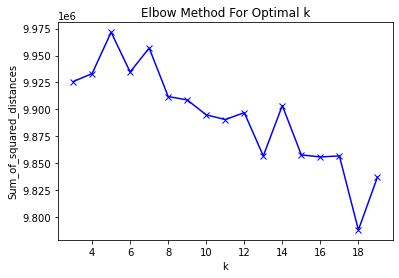

In [215]:
elbow_plot(document_matrix_df, min_k=3, max_k=20)

We can see that even with `k=20` clusters, there is still no defined elbow in the plot. Let's try doubling the `k` and see what happens.

100%|███████████████████████████████████████████████████████████████████████████████| 37/37 [2:35:56<00:00, 252.89s/it]


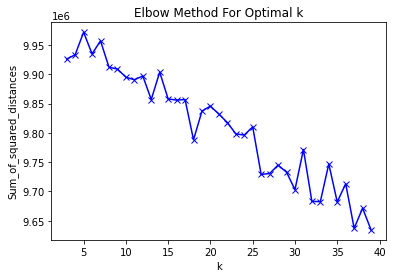

In [216]:
elbow_plot(document_matrix_df, min_k=3, max_k=40)

Even with 40 clusters calculated, there is still no identifiable optimal number for `k`. I have switched now to using `MiniBatchKMeans` as I've read it is faster than standard `KMeans`.

100%|███████████████████████████████████████████████████████████████████████████████| 77/77 [4:00:37<00:00, 187.50s/it]


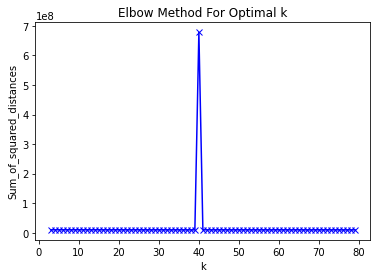

In [264]:
elbow_plot(document_matrix_df, min_k=3, max_k=80)

We can see it is not the time to use `KMeans`, and even `MiniBatchKMeans`, is not the right clustering algorithm because our data has far too high of a number of dimensions. We can try to normalize the data first, and then use `tSNE` for feature reduction.

First we normalize the data using `StandardScalar` from `sklearn.preprocessing`.

In [34]:
from sklearn.preprocessing import StandardScaler

X = document_matrix_df.loc[:, document_matrix_df.columns != 'question_type']
y = document_matrix_df.loc[:, 'question_type']

scaler = StandardScaler()
X_norm = scaler.fit_transform(X)

In [35]:
X_norm

array([[ 1.50724915e+02,  1.50724915e+02,  1.73758453e+01, ...,
        -6.63460318e-03,  0.00000000e+00, -6.63460318e-03],
       [-6.63460318e-03, -6.63460318e-03, -5.75511569e-02, ...,
        -6.63460318e-03,  0.00000000e+00, -6.63460318e-03],
       [-6.63460318e-03, -6.63460318e-03, -5.75511569e-02, ...,
        -6.63460318e-03,  0.00000000e+00, -6.63460318e-03],
       ...,
       [-6.63460318e-03, -6.63460318e-03, -5.75511569e-02, ...,
        -6.63460318e-03,  0.00000000e+00, -6.63460318e-03],
       [-6.63460318e-03, -6.63460318e-03, -5.75511569e-02, ...,
        -6.63460318e-03,  0.00000000e+00, -6.63460318e-03],
       [-6.63460318e-03, -6.63460318e-03, -5.75511569e-02, ...,
         1.50724915e+02,  0.00000000e+00,  1.50724915e+02]])

Then we use `tSNE` for feature reduction. I will plot each result so I can optimally tune the hyperparameters.

In [349]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_values(data, labels, title, position, size=1, hide_legend=True):
    if labels is not None:
        scatter = sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=labels, ax=position, s=size)
    else:
        scatter = sns.scatterplot(x=data[:, 0], y=data[:, 1], ax=position, s=size)
    position.set_title(title)
    
    if hide_legend:
        position.legend([],[], frameon=False)

In [87]:
from sklearn.manifold import TSNE

# X_norm_TSNE_cache = {}
# X_TSNE_cache = {}
# TSNE_cache = {}

In [179]:
def tsne_2D(dataset, perplexity, normalized, verbose=True):
    if perplexity in TSNE_cache:
        if verbose:
            print('Using cached TSNE instance.')
        tsne = TSNE_cache[perplexity]
    else:
        if verbose:
            print('Creating new TSNE instance.')
        tsne = TSNE(n_components=2, random_state=0, perplexity=perplexity)
        TSNE_cache[perplexity] = tsne

    if normalized:
        if perplexity in X_norm_TSNE_cache:
            if verbose:
                print('Using cached normalized dataset_2D.')
            dataset_2D = X_norm_TSNE_cache[perplexity]
        else:
            if verbose:
                print('Creating new normalized dataset_2D.')
            dataset_2D = tsne.fit_transform(dataset)
            X_norm_TSNE_cache[perplexity] = dataset_2D
    else:
        if perplexity in X_TSNE_cache:
            if verbose:
                print('Using cached dataset_2D.')
            dataset_2D = X_TSNE_cache[perplexity]
        else:
            if verbose:
                print('Creating new dataset_2D.')
            dataset_2D = tsne.fit_transform(dataset)
            X_TSNE_cache[perplexity] = dataset_2D

    return dataset_2D

After plotting a few of the feature reduction plots, it was is still not giving us optimal grouping of points, even when coloring it by `question_type` to see how the data was originally classified. I had assumed that normalizing the data was the correct approach but let's see if using the original `tf idf` data has any difference.

I decided it would be easier to compare the results by creating functions that cache both the `TSNE` model and the resulting 2 dimensional datasets so that I could plot them side by side. Below, I plot the original and normalized datasets for the following perplexities `[1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 100, 220, 300]` with the `question_type` as the hue. This allows me to tune the hyperparameters of the `TSNE` model visually.

While usually the optimal `perplexity` is between 5 and 50, I read that it might be useful to try and visualize with a `perplexity` roughly equal to five percent of the size of the data. So since our dataset is over 22,000 rows, let's try with a `perplexity` of 220.

Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cache

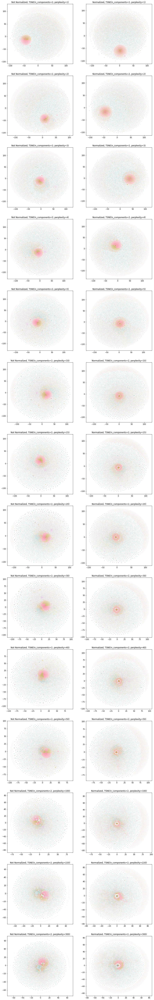

In [168]:
perplexities_to_test = [1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 100, 220, 300]
sub_plot_length = len(perplexities_to_test)
figure_size = (15, int(15*(sub_plot_length/2)))
fig, axs = plt.subplots(sub_plot_length,2, figsize=figure_size)

i = 0
for perp in perplexities_to_test:
    j = 0
    for data, norm in zip([X, X_norm],[False, True]):
        if norm:
            title = f'Normalized, TSNE(n_components=2, perplexity={perp})'
        else:
            title = f'Not Normalized, TSNE(n_components=2, perplexity={perp})'
        plot_values(tsne_2D(data, perp, norm), y, title, axs[i,j])
        j += 1
    i += 1

And I will plot it again without the color for `question_type` just to make sure I can clearly see whether or not there are any groupings.

Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cached TSNE instance.
Using cached normalized dataset_2D.
Using cached TSNE instance.
Using cached dataset_2D.
Using cache

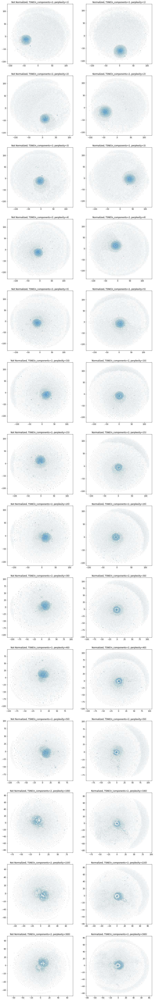

In [169]:
perplexities_to_test = [1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50, 100, 220, 300]
sub_plot_length = len(perplexities_to_test)
figure_size = (15, int(15*(sub_plot_length/2)))
fig, axs = plt.subplots(sub_plot_length,2, figsize=figure_size)

i = 0
for perp in perplexities_to_test:
    j = 0
    for data, norm in zip([X, X_norm],[False, True]):
        if norm:
            title = f'Normalized, TSNE(n_components=2, perplexity={perp})'
        else:
            title = f'Not Normalized, TSNE(n_components=2, perplexity={perp})'
        plot_values(tsne_2D(data, perp, norm), None, title, axs[i,j])
        j += 1
    i += 1

It's difficult to tell what the optimal `perplexity` is since all the points are so close together, and since it looks like some of the original classes overlapped. I think for the original data, the `perplexity` of `[40, 50, 100]` were the most promising, and for the normalized data, the `perplexity` of `[15, 30, 100]` were the most promising. Let's plot elbow graphs for each of them.

In [206]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def elbow_plot(doc_matrix, position, title, min_k=2, max_k=25, max_iter=200, n_init=10, verbose=False, elbow_cache=None):
    K = range(min_k,max_k)
    sum_of_squared_distances=[]
    for k in tqdm(K):
        if k in elbow_cache:
            sum_of_squared_distances.append(elbow_cache[k])
        else:
            km = KMeans(n_clusters=k, max_iter=max_iter, n_init=n_init)
            km = km.fit(doc_matrix)
            sum_of_squared_distances.append(km.inertia_)
            elbow_cache[k] = km.inertia_
        if verbose:
            print('Computed for k =', k)
    position.plot(K, sum_of_squared_distances, 'bx-')
    position.set(xticks=np.arange(0, 25, 1))
#     position.set(xlabel='k', ylabel='Sum_of_squared_distances')
    position.set_title(f'Elbow Method For Optimal k\n{title}')

In [181]:
elbow_cache_p40 = {}
elbow_cache_p50 = {}
elbow_cache_p100 = {}
elbow_cache_norm_p15 = {}
elbow_cache_norm_p30 = {}
elbow_cache_norm_p100 = {}
elbow_cache = {40: elbow_cache_p40,
               50: elbow_cache_p50,
               100: elbow_cache_p100}
elbow_cache_norm = {15: elbow_cache_norm_p15,
                    30: elbow_cache_norm_p30,
                    100: elbow_cache_p100}

100%|██████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<?, ?it/s]


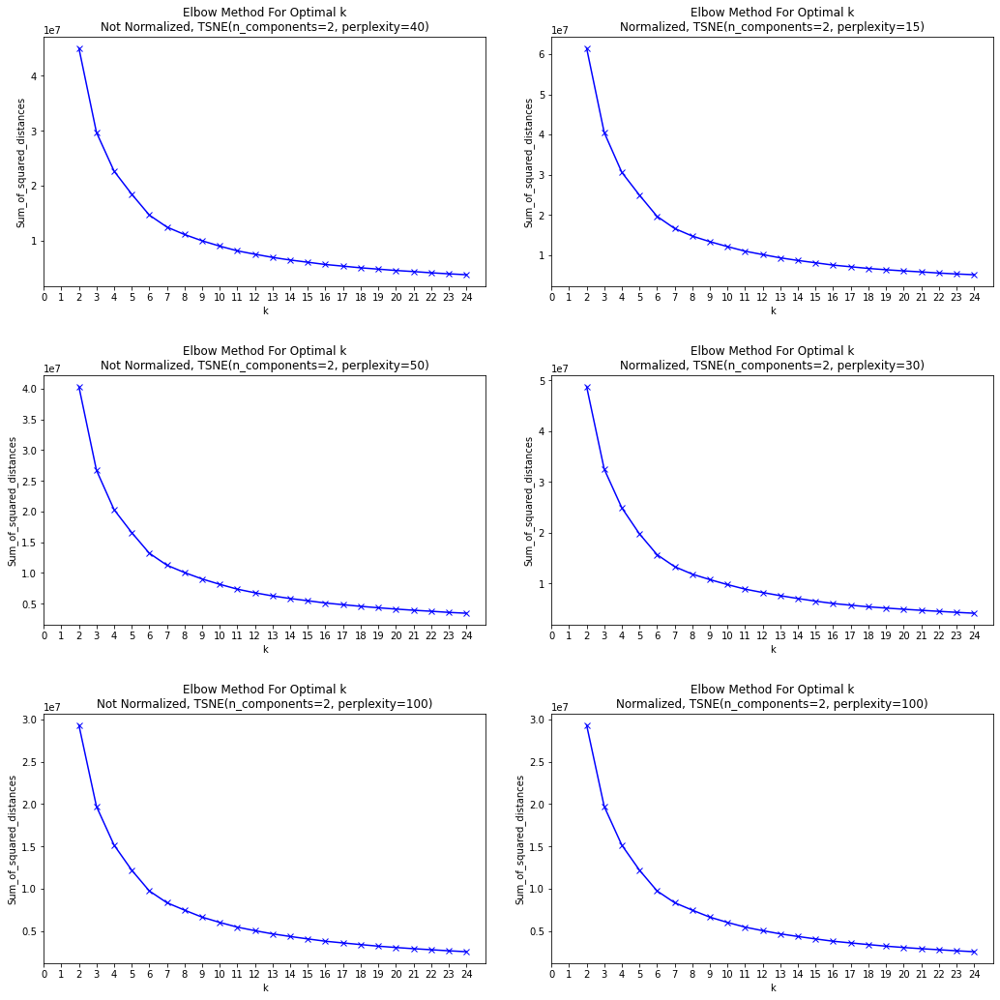

In [213]:
perp_for_elbow_X = [40, 50, 100]
perp_for_elbow_X_norm = [15, 30, 100]
sub_plot_length = len(perp_for_elbow_X)
figure_size = (15, int(15*(sub_plot_length/3)))
fig, axs = plt.subplots(sub_plot_length,2, figsize=figure_size)

i = 0
for perp, norm_perp in zip(perp_for_elbow_X,perp_for_elbow_X_norm):
    title = f'Not Normalized, TSNE(n_components=2, perplexity={perp})'
    norm_title = f'Normalized, TSNE(n_components=2, perplexity={norm_perp})'
    dataset_2D = tsne_2D(X, perp, False, verbose=False)
    dataset_2D_norm = tsne_2D(X_norm, norm_perp, True, verbose=False)
    
    elbow_plot(dataset_2D,axs[i,0],title,elbow_cache=elbow_cache[perp])
    elbow_plot(dataset_2D_norm,axs[i,1],norm_title,elbow_cache=elbow_cache_norm[norm_perp])
    i += 1
for ax in axs.flat:
    ax.set(xlabel='k', ylabel='Sum_of_squared_distances')
fig.tight_layout(pad=3)

I've decided to stick with the normalized feature reduction, with the default `perplexity` of 30. We can see about 6 to 9 is the optimal `k`. We will increase the upper bound to 12 since that was the original number of `question_type`.

In [221]:
reduced_matrix = pd.DataFrame(
    tsne_2D(X_norm, 30, True, verbose=False),
    columns=['tsne1','tsne2'],
    index=document_matrix_df.index)

In [ ]:
kmeans_cache = {}
clusters_cache = {}

In [240]:
from sklearn.metrics import silhouette_score

K = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

for k in K:
    if k not in kmeans_cache:
        kmeans = KMeans(n_clusters=k, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(reduced_matrix)
        kmeans_cache[k] = kmeans
    else:
        kmeans = kmeans_cache[k]
        
    labels = kmeans.labels_
    
    if k not in clusters_cache:
        clusters = reduced_matrix.copy()
        clusters['tsne_clusters'] = labels
        clusters_cache[k] = clusters
    
    print(f'KMeans tSNE Silhouette Score for k={k}: {silhouette_score(reduced_matrix, labels)}')
    

KMeans tSNE Silhouette Score for k=3: 0.33334460854530334
KMeans tSNE Silhouette Score for k=4: 0.32692286372184753
KMeans tSNE Silhouette Score for k=5: 0.34830865263938904
KMeans tSNE Silhouette Score for k=6: 0.3672698438167572
KMeans tSNE Silhouette Score for k=7: 0.3651540279388428
KMeans tSNE Silhouette Score for k=8: 0.35524290800094604
KMeans tSNE Silhouette Score for k=9: 0.33922073245048523
KMeans tSNE Silhouette Score for k=10: 0.33052173256874084
KMeans tSNE Silhouette Score for k=11: 0.3361075520515442
KMeans tSNE Silhouette Score for k=12: 0.3388724625110626


We have the highest `silhouette_score` for 6 clusters so we will use that.

In [239]:
km_clustered_6 = clusters_cache[6]
km_clustered_6.head(5)

,tsne1,tsne2,tsne_clusters
question,,,
Do you have information about Refractive eye surgery - what to ask your doctor,8.451976,-0.851596,0
Do you have information about Ammonium hydroxide poisoning,79.203995,70.735062,1
Do you have information about Lymphangiogram,-2.299719,-13.607514,0
Do you have information about Folic acid in diet,-1.588174,-0.618751,0
What is (are) Incontinentia pigmenti ?,-55.647964,32.538960,4


Now we can plot the clustering to see if it is optimal.

## 2. Cluster Labeling
Provide a descriptive label for each topic, e.g. "Side Effects" or "Pneumonia".

Let's plot the `KMeans` clusters next to the original dataset to see how it compares. Then we can decide on cluster labeling.

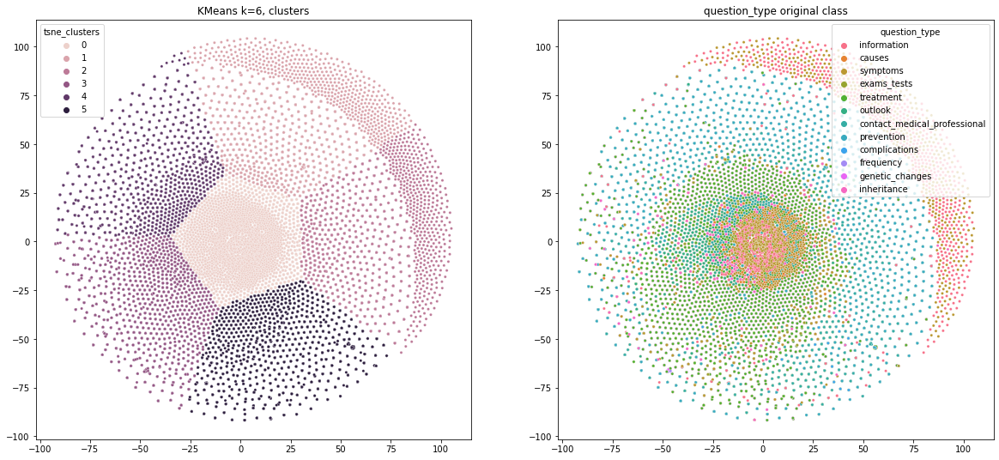

In [270]:
fig, axs = plt.subplots(1,2, figsize=(20,9))

plot_values(
    data=km_clustered_6.iloc[:,0:2].to_numpy(),
    labels=km_clustered_6.iloc[:,2],
    title='KMeans k=6, clusters',
    position=axs[0],
    size=10,
    hide_legend=False)

plot_values(
    data=km_clustered_6.iloc[:,0:2].to_numpy(),
    labels=y,
    title='question_type original class',
    position=axs[1],
    size=10,
    hide_legend=False)

This clustering is not ideal, not only because it doesn't come close to the original classes but also because `KMeans` needs to assign every point to a cluster, leading to cluster shapes like this when they are all so close together. Let's try another clustering algorithm that is allowed to have outliers, such as `DBSCAN`.

In [267]:
from sklearn.cluster import DBSCAN

def dbscan_fit(data,eps=1,min_samp=5):
    clusterer = DBSCAN(eps=eps,min_samples=min_samp)
    a = clusterer.fit(data.iloc[:, 0:2])
    data[f'dbscan_e{eps}_s{min_samp}'] = a.labels_
    return data

In [269]:
dbscan_cache = {}

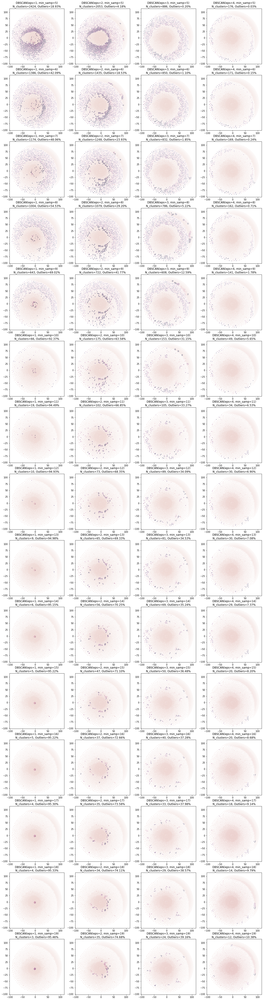

In [315]:
eps_to_test = range(1,5)
min_samp_to_test = range(5,20)
figure_size = (20, int(20*(len(eps_to_test))))
fig, axs = plt.subplots(len(min_samp_to_test),len(eps_to_test), figsize=figure_size)

i = 0
for min_samp in min_samp_to_test:
    j = 0
    for eps in eps_to_test:
        label_col = f'dbscan_e{eps}_s{min_samp}'
        
        if label_col not in dbscan_cache:
            data = dbscan_fit(km_clustered_6, eps=eps, min_samp=min_samp)
            dbscan_cache[label_col] = data
        else:
            data = dbscan_cache[label_col]
            
        percent_outliers = len(data[data[label_col]==-1])*100/len(data)
        title = f'DBSCAN(eps={eps}, min_samp={min_samp})'
        title += f'\nN_clusters={len(data[label_col].unique())}, Outliers={percent_outliers:.2f}%'
        
        
        plot_values(
            data=data.iloc[:,0:2].to_numpy(),
            labels=data[label_col],
            title=title,
            position=axs[i,j],
            size=2)
        j += 1
    i += 1

Unfortunately, even with `DBSCAN` we are having issues with the projection from `tSNE`. It seems as though we will have either a high number of clusters, a high number of outliers, or both low cluster and low outliers with extremely disproportionate cluster allocation. Even so, it looks like `DBSCAN` had marginally better clustering than `KMeans`, which only split the plot into 6 equal segments. Let's take the plot with `eps=2` and `min_samples=7` to compare with `KMeans` and the original classification with `question_type`.

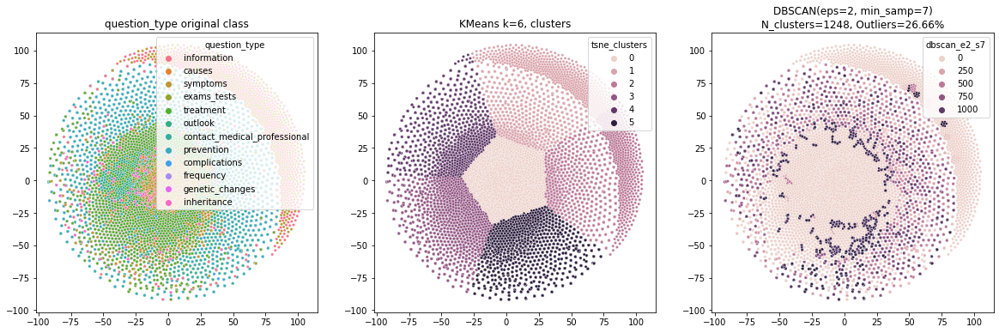

In [351]:
fig, axs = plt.subplots(1,3, figsize=(20,6))

plot_values(
    data=km_clustered_6.iloc[:,0:2].to_numpy(),
    labels=y,
    title='question_type original class',
    position=axs[0],
    size=10,
    hide_legend=False)

plot_values(
    data=km_clustered_6.iloc[:,0:2].to_numpy(),
    labels=km_clustered_6.iloc[:,2],
    title='KMeans k=6, clusters',
    position=axs[1],
    size=10,
    hide_legend=False)

eps=2
min_samp=7
label_col = f'dbscan_e{eps}_s{min_samp}'
km_clustered_6[label_col] = list(dbscan_cache[label_col][label_col])
title = f'DBSCAN(eps={eps}, min_samp={min_samp})'
title += f'\nN_clusters={len(km_clustered_6[label_col].unique())}, Outliers={percent_outliers:.2f}%'

plot_values(
    data=km_clustered_6.iloc[:,0:2].to_numpy(),
    labels=km_clustered_6.loc[:,label_col],
    title=title,
    position=axs[2],
    size=10,
    hide_legend=False)

In [360]:
km_clustered_6['question_type'] = list(y)
print('Counts for question_type')
km_clustered_6['question_type'].value_counts()

Counts for question_type


information                     5562
symptoms                        3322
treatment                       2599
causes                          1736
outlook                         1451
contact_medical_professional    1420
exams_tests                     1370
inheritance                     1369
genetic_changes                 1085
frequency                       1085
complications                    872
prevention                       848
Name: question_type, dtype: int64

In [354]:
print('Counts for KMeans clusters')
km_clustered_6['tsne_clusters'].value_counts()

Counts for KMeans clusters


0    5643
4    3444
5    3429
1    3424
2    3398
3    3381
Name: tsne_clusters, dtype: int64

In [357]:
print('Counts for question_type')
km_clustered_6[label_col].value_counts(ascending=False)

Counts for question_type


 0       6080
-1       5437
 1100      45
 14        45
 1102      41
         ... 
 536        7
 520        7
 1076       7
 518        7
 1246       3
Name: dbscan_e2_s7, Length: 1248, dtype: int64

The last thing we can try to do is topic modeling with `LDA`.

In [20]:
lda_testing_df = vocabulary_df[['tokens','question_type','question']].copy()
lda_testing_df.set_index('question', inplace=True)
q_docs = list(lda_testing_df['tokens'])

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [22]:
import gensim
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [25]:
q_dictionary = gensim.corpora.Dictionary(q_docs)
q_corpus = [q_dictionary.doc2bow(question) for question in q_docs]

iterations = 50

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [28]:
topic_model_cache = {}
lda_vis_cache = {}

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [29]:
def lda_topic_modeling(num_topics=6):
    if num_topics in topic_model_cache:
        return topic_model_cache[num_topics], lda_vis_cache[num_topics]
    
    topic_model = gensim.models.ldamodel.LdaModel(q_corpus, num_topics=num_topics, id2word=q_dictionary, passes=iterations)
    lda_vis = gensimvis.prepare(topic_model, q_corpus, q_dictionary, sort_topics=False)
    
    topic_model_cache[num_topics] = topic_model
    lda_vis_cache[num_topics] = lda_vis
    
    return topic_model, lda_vis

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [31]:
topic_model_k6, lda_vis_k6 = lda_topic_modeling(num_topics=6)
pyLDAvis.display(lda_vis_k6)

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [32]:
topic_model_k8, lda_vis_k8 = lda_topic_modeling(num_topics=8)
pyLDAvis.display(lda_vis_k8)

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [33]:
topic_model_k10, lda_vis_k10 = lda_topic_modeling(num_topics=10)
pyLDAvis.display(lda_vis_k10)

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [34]:
topic_model_k12, lda_vis_k12 = lda_topic_modeling(num_topics=12)
pyLDAvis.display(lda_vis_k12)

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [35]:
topic_model_k4, lda_vis_k4 = lda_topic_modeling(num_topics=4)
pyLDAvis.display(lda_vis_k4)

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [37]:
topic_model_k3, lda_vis_k3 = lda_topic_modeling(num_topics=3)
pyLDAvis.display(lda_vis_k3)

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [38]:
topic_model_k20, lda_vis_k20 = lda_topic_modeling(num_topics=20)
pyLDAvis.display(lda_vis_k20)

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [39]:
num_topics = list(range(1,16))
num_keywords = 15
    
LDA_topics = {}

for k in num_topics:
    if k not in topic_model_cache:
        topic_model_cache[k] = gensim.models.ldamodel.LdaModel(
            q_corpus,
            num_topics=k,
            id2word=q_dictionary,
            passes=iterations)
    else:
        print(f'Using cached model for k={k}')

    shown_topics = topic_model_cache[k].show_topics(num_topics=k, 
                                             num_words=num_keywords,
                                             formatted=False)
    
    LDA_topics[k] = [[word[0] for word in topic[1]] for topic in shown_topics]

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Using cached model for k=3
Using cached model for k=4
Using cached model for k=6
Using cached model for k=8
Using cached model for k=10
Using cached model for k=12


In [40]:
def jaccard_similarity(topic_1, topic_2):
    """
    Derives the Jaccard similarity of two topics

    Jaccard similarity:
    - A statistic used for comparing the similarity and diversity of sample sets
    - J(A,B) = (A ∩ B)/(A ∪ B)
    - Goal is low Jaccard scores for coverage of the diverse elements
    """
    intersection = set(topic_1).intersection(set(topic_2))
    union = set(topic_1).union(set(topic_2))
                    
    return float(len(intersection))/float(len(union))

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [41]:
LDA_stability = {}
for i in range(0, len(num_topics)-1):
    jaccard_sims = []
    for t1, topic1 in enumerate(LDA_topics[num_topics[i]]): # pylint: disable=unused-variable
        sims = []
        for t2, topic2 in enumerate(LDA_topics[num_topics[i+1]]): # pylint: disable=unused-variable
            sims.append(jaccard_similarity(topic1, topic2))    
        
        jaccard_sims.append(sims)    
    
    LDA_stability[num_topics[i]] = jaccard_sims
                
mean_stabilities = [np.array(LDA_stability[i]).mean() for i in num_topics[:-1]]

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [49]:
topic_model_cache

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{6: <gensim.models.ldamodel.LdaModel at 0x1f3ac107bb0>,
 8: <gensim.models.ldamodel.LdaModel at 0x1f3b26758b0>,
 10: <gensim.models.ldamodel.LdaModel at 0x1f3b26855e0>,
 12: <gensim.models.ldamodel.LdaModel at 0x1f3b2685850>,
 4: <gensim.models.ldamodel.LdaModel at 0x1f3b25f08b0>,
 3: <gensim.models.ldamodel.LdaModel at 0x1f3b261b610>,
 20: <gensim.models.ldamodel.LdaModel at 0x1f3b268d3d0>,
 1: <gensim.models.ldamodel.LdaModel at 0x1f3b2901e50>,
 2: <gensim.models.ldamodel.LdaModel at 0x1f3b26cc220>,
 5: <gensim.models.ldamodel.LdaModel at 0x1f3b27ca400>,
 7: <gensim.models.ldamodel.LdaModel at 0x1f3b2c6d4f0>,
 9: <gensim.models.ldamodel.LdaModel at 0x1f3b2901a60>,
 11: <gensim.models.ldamodel.LdaModel at 0x1f3b2901340>,
 13: <gensim.models.ldamodel.LdaModel at 0x1f3b29018b0>,
 14: <gensim.models.ldamodel.LdaModel at 0x1f3b2901850>,
 15: <gensim.models.ldamodel.LdaModel at 0x1f3b2c6dc40>}

In [44]:
coherences = [gensim.models.CoherenceModel(model=topic_model_cache[i], texts=q_corpus, dictionary=q_dictionary, coherence='c_v').get_coherence()\
              for i in num_topics[:-1]]

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\gensim\topic_coherence\direct_confirmation_measure.py:202: RuntimeWarning: invalid value encountered in true_divide
  numerator = (co_occur_count / num_docs) + EPSILON
C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\gensim\topic_coherence\direct_confirmation_measure.py:203: RuntimeWarning: invalid value encountered in true_divide
  denominator = (w_prime_count / num_docs) * (w_star_count / num_docs)
C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\gensim\topic_coherence\direct_confirmation_measure.py:198: RuntimeWarning: invalid value encountered in true_divide
  

In [48]:
coherences

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]

In [45]:
coh_sta_diffs = [coherences[i] - mean_stabilities[i] for i in range(num_keywords)[:-1]] # limit topic numbers to the number of keywords
coh_sta_max = max(coh_sta_diffs)
coh_sta_max_idxs = [i for i, j in enumerate(coh_sta_diffs) if j == coh_sta_max]
ideal_topic_num_index = coh_sta_max_idxs[0] # choose less topics in case there's more than one max
ideal_topic_num = num_topics[ideal_topic_num_index]

C:\ProgramData\Anaconda3\envs\lang\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


IndexError: list index out of range

In [ ]:
plt.figure(figsize=(20,10))
ax = sns.lineplot(x=num_topics[:-1], y=mean_stabilities, label='Average Topic Overlap')
ax = sns.lineplot(x=num_topics[:-1], y=coherences, label='Topic Coherence')

ax.axvline(x=ideal_topic_num, label='Ideal Number of Topics', color='black')
ax.axvspan(xmin=ideal_topic_num - 1, xmax=ideal_topic_num + 1, alpha=0.5, facecolor='grey')

y_max = max(max(mean_stabilities), max(coherences)) + (0.10 * max(max(mean_stabilities), max(coherences)))
ax.set_ylim([0, y_max])
ax.set_xlim([1, num_topics[-1]-1])
                
ax.axes.set_title('Model Metrics per Number of Topics', fontsize=25)
ax.set_ylabel('Metric Level', fontsize=20)
ax.set_xlabel('Number of Topics', fontsize=20)
plt.legend(fontsize=20)
plt.show()   

In [364]:
final_df = reduced_matrix.copy()
final_df['question_type'] = pd.Categorical(km_clustered_6['question_type'])
final_df['question_type_id'] = final_df['question_type'].cat.codes
final_df['kmeans_k6'] = km_clustered_6['tsne_clusters']
final_df[label_col] = km_clustered_6[label_col]

## 3. Results
Report your results.

Unfortunately, my results are not ideal. This analysis showed just how difficult it is to adequately analyze textual data and extract useful insights.

In [365]:
final_df

,tsne1,tsne2,question_type,question_type_id,kmeans_k6,dbscan_e2_s7
question,,,,,,
Do you have information about Refractive eye surgery - what to ask your doctor,8.451976,-0.851596,information,6,0,0
Do you have information about Ammonium hydroxide poisoning,79.203995,70.735062,information,6,1,-1
Do you have information about Lymphangiogram,-2.299719,-13.607514,information,6,0,0
Do you have information about Folic acid in diet,-1.588174,-0.618751,information,6,0,0
What is (are) Incontinentia pigmenti ?,-55.647964,32.538960,information,6,4,1
...,...,...,...,...,...,...
What are the treatments for Duane syndrome type 1 ?,-20.010679,5.128408,treatment,11,0,0
What are the symptoms of Striatonigral degeneration infantile ?,-36.810535,91.669281,symptoms,10,4,-1
"What are the symptoms of Maturity-onset diabetes of the young, type 7 ?",5.943194,-8.491862,symptoms,10,0,0


In [477]:
final_df.to_csv('final_df.csv')

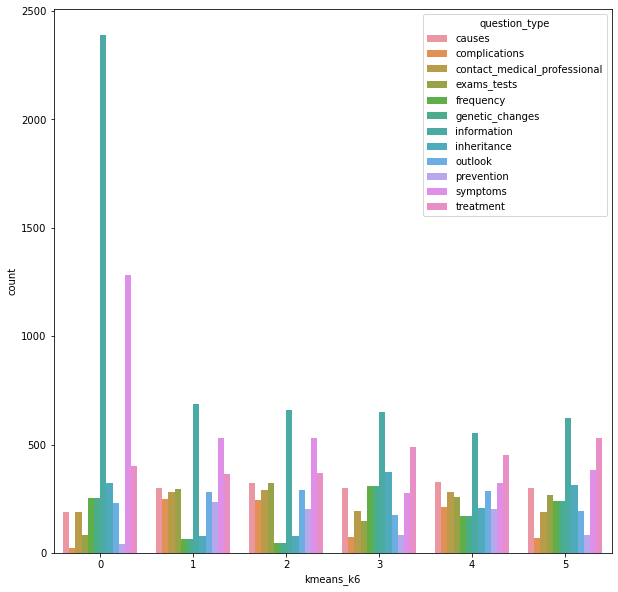

In [377]:
ax = sns.countplot(hue="question_type", x="kmeans_k6", data=final_df)

Taking the `KMeans` clustering, for example, we can see that the original categories are distributed across all of the found clusters. It seems as though the original categorization of `question_type` may not have been as useful as we originally thought. I was able to get meaningful clustering with distinct boundaries using `LDA` however there were significantly less topics/clusters in this topic modeling than there was in the original dataset.

### Future Research
I believe further analysis is needed for a better understanding of this data. Some things to keep in mind going forward:
1. It may be better to start off with a completely unsupervised approach using only the tokens found in the questions. This means excluding `focus` and `synonyms`.
2. Additionally, it might be beneficial to the analysis to use `PCA` before `tSNE` to eliminate noise and reduce the features to only those that explain the most variance. This way, when `tSNE` is used, it is only reducing the important features.
3. I suggest trying different `n` for dimensions when using `tSNE`, as I only tested it with 2 dimensions. This seemed to hinder the analysis as it is very difficult to reduce 30,000+ features to just 2.
4. The `question_type` field does not seem to have been derived in any meaningful way with regards to NLP. with completely unsupervised learning, we may be able to find a much better grouping of clusters and be able to accurately model the topics of each cluster.